Source: https://tia-toolbox.readthedocs.io/en/latest/_notebooks/jnb/06-semantic-segmentation.html

In [2]:
##Modules & Packages##

# Clear logger to import TIAtoolbox
import logging #general event tracking/debugging module
import warnings #alerting module

#function to clear existing loggers if any
if logging.getLogger().hasHandlers():
    logging.getLogger().handlers.clear()

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import cm

from tiatoolbox import logger
from tiatoolbox.models.architecture.unet import UNetModel
from tiatoolbox.models.engine.semantic_segmentor import (IOSegmentorConfig, SemanticSegmentor,)

from tiatoolbox.utils.misc import download_data, imread
from tiatoolbox.utils.visualization import overlay_prediction_mask
from tiatoolbox.wsicore.wsireader import WSIReader

mpl.rcParams["figure.dpi"] = 300 #for high-resolution figures
mpl.rcParams["figure.facecolor"] = "white" #visibility in dark mode
warnings.filterwarnings("ignore") #suppress warnings for clarity


|2026-01-11|18:21:46.824| [WARNING] C:\Users\swowg\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm

|2026-01-11|18:21:57.010| [WARNING] C:\Users\swowg\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\albumentations\__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()



In [3]:
# Check CUDA availability
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}")
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    print("No CUDA support - you have CPU-only PyTorch installed")

PyTorch version: 2.5.1+cu121
CUDA available: True
CUDA version: 12.1
GPU: NVIDIA GeForce RTX 3060


## 1. Download and import data

In [4]:
# File names
img_file_name = "sample_tile.jpg"
wsi_file_name = "sample_wsi.svs"
mini_wsi_file_name = "mini_wsi.svs"
model_file_name = "tissue_mask_model.pth"

logger.info("Download has started. Please wait...")

# Download sample tile
download_data("https://tiatoolbox.dcs.warwick.ac.uk/sample_imgs/breast_tissue.jpg", img_file_name)

# Download sample wsi
download_data("https://tiatoolbox.dcs.warwick.ac.uk/sample_wsis/wsi4_12k_12k.svs", wsi_file_name)

# Download mini wsi
download_data("https://tiatoolbox.dcs.warwick.ac.uk/sample_wsis/CMU-1.ndpi", mini_wsi_file_name)

# Download pre-trained model
download_data("https://tiatoolbox.dcs.warwick.ac.uk//models/seg/fcn-tissue_mask.pth", model_file_name)

logger.info("Download is complete.")

|2026-01-11|18:21:59.070| [INFO] Download has started. Please wait...
|2026-01-11|18:21:59.071| [INFO] Download is complete.


# 2. Inference on tiles

In [5]:
# Title prediction
bcc_segmentor = SemanticSegmentor(
    pretrained_model = "fcn_resnet50_unet-bcss", 
    num_loader_workers = 0, #set to 0 for Windows to avoid kernel crashes
    batch_size = 2, #reduced from 4 to 2 to save memory
)

import os
import shutil
# Clean up old results if they exist
if os.path.exists("sample_tile_results"):
    shutil.rmtree("sample_tile_results")

output = bcc_segmentor.predict( 
    [img_file_name], #list of input images (can be WSI or tiles)
    save_dir = "sample_tile_results/",
    mode = "tile",
    resolution = 1.0,
    units = "baseline",
    patch_input_shape = [1024, 1024],
    patch_output_shape = [512, 512],
    stride_shape = [512, 512],
    device = "cuda",
    crash_on_exception = True,
)

|2026-01-11|18:21:59.626| [WARNING] GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.
|2026-01-11|18:21:59.629| [WARNING] WSIPatchDataset only reads image tile at `units="baseline"`. Resolutions will be converted to baseline value.
|2026-01-11|18:21:59.950| [WARNING] WSIPatchDataset only reads image tile at `units="baseline"`. Resolutions will be converted to baseline value.
|2026-01-11|18:22:00.237| [WARNING] Raw data is None.
|2026-01-11|18:22:00.238| [WARNING] Unknown scale (no objective_power or mpp)
Process Batch: 100%|############################| 32/32 [00:08<00:00,  3.73it/s]

|2026-01-11|18:22:10.307| [INFO] Finish: 0
|2026-01-11|18:22:10.308| [INFO] --Input: sample_tile.jpg
|2026-01-11|18:22:10.308| [INFO] --Output: C:\Users\swowg\Desktop\Master HCAI\HCAI - UMCU\UMCU_Histology\Semantic Segmentation TUT\sample_tile_results\0


## 3. Dictionary

- `pretrained_model`: pre-trained model, which is a fully CNN that follows UNet network architecture.
- `fcn_resnet50_unet-bcss`: ^ **Trained on the Breast Cancer Semantic Segmentation dataset**. Pathologists manually annotated images, this pretrained model now recognizes visual patterns.
- `num_loader_workers`: number of CPU cores responsible for 'loading of network input' process = patch extraction, preprocessing, data handling, etc.
- `batch_size`: controls batch size, or number of input instances to the network in each iteration.
- `predict`: method to do inference on a list of input images, or WSIs. **Automatically** processes all the images and saves the results on the disk.
- `imgs`: List of inputs to be processed -> should be paths to the inputs stored on the disk.
- `save_dir`: path to the main folder in which prediction results for each input will be stored seperately.
- `mode`: the mode of inference which can be set to either 'tile' or 'wsi' for plain histology images or structured wsi, respectively.
- `resolution` and `unit`: specification of resolution of input image. Plain images only have a baseline layer, the options in this case should always be the defaults `units = "baseline"` and `resolution = 1.0`.
- `patch_input_shape`: shape of the patches extracted from the input image (WSI) to be fed into the model. Bigger patch size requires more GPU memory.
- `patch_output_shape`: expected shape of output prediction maps for patches. Ratio is half of the input shape. So 1024 -> 512
- `stride_shape`: stride of output patches during tile and WSI processing. This parameter is used to set the amount of overlap between N-prediction patches. This parameter makes the toolbox automatically calculate the patch extraction stride.
- `device`: specification of appropriate devide. In this case its cuda, because GPU cant be used.
- `crash_on_exception`: set to True, the running loop will crash if there is an error during processing WSI. Otherwise, loop will move on to the next wsi for processing. Consider modifying to False if the model is working as expected to process large cohorts of inputs.


|2026-01-11|18:22:10.568| [INFO] Prediction method output is: sample_tile.jpg, C:\Users\swowg\Desktop\Master HCAI\HCAI - UMCU\UMCU_Histology\Semantic Segmentation TUT\sample_tile_results\0
|2026-01-11|18:22:10.653| [INFO] Raw prediction dimensions: (4000, 4000, 5)
|2026-01-11|18:22:10.845| [INFO] Processed prediction dimensions: (4000, 4000)
|2026-01-11|18:22:11.016| [INFO] Input image dimensions: (4000, 4000, 3)


Text(0.5, 0.82, 'Processed prediction map')

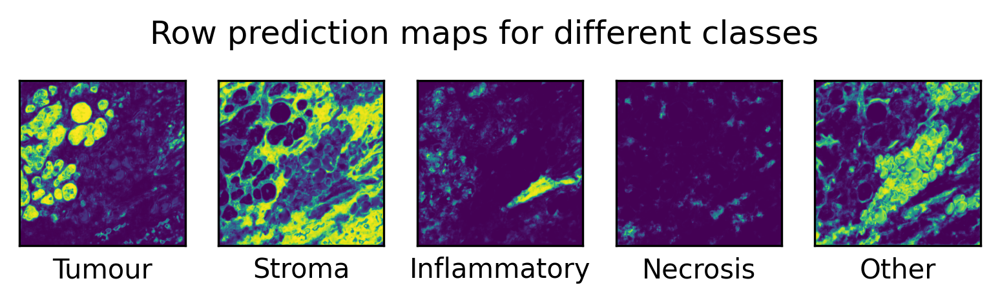

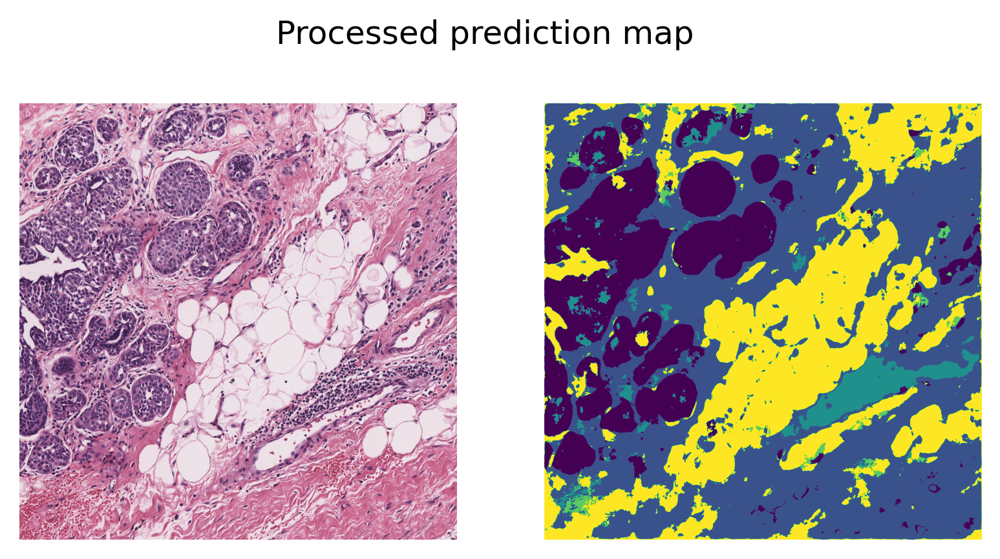

In [6]:
logger.info("Prediction method output is: %s, %s",
output[0][0],
output[0][1],
)
tile_prediction_raw = np.load(
    output[0][1] + ".raw.0.npy", # Loading the first prediction [0] based on the ouput path [1]
)
logger.info("Raw prediction dimensions: (%d, %d, %d)",
tile_prediction_raw.shape[0],
tile_prediction_raw.shape[1],
tile_prediction_raw.shape[2],
)

# Simple processing of the raw prediction to generate segmentation task
tile_prediction = np.argmax(
    tile_prediction_raw,
    axis = -1,
) # Select class with highest probability
logger.info("Processed prediction dimensions: (%d, %d)",
tile_prediction.shape[0], 
tile_prediction.shape[1],
)

# Visualize tile prediction
tile = imread(img_file_name)
logger.info("Input image dimensions: (%d, %d, %d)",
tile.shape[0],
tile.shape[1],
tile.shape[2],
)

fig = plt.figure()
label_names_dict = {
    0: "Tumour",
    1: "Stroma",
    2: "Inflammatory",
    3: "Necrosis",
    4: "Other",
}
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    (
        plt.imshow(tile_prediction_raw[:, :, i]),
        plt.xlabel(
            label_names_dict[i],
        ),
        ax.axes.xaxis.set_ticks([]),
        ax.axes.yaxis.set_ticks([]),
    )
fig.suptitle("Row prediction maps for different classes", y = 0.65)

# Show results
fig2 = plt.figure()
ax1 = plt.subplot(1, 2, 1), plt.imshow(tile), plt.axis("off")
ax2 = plt.subplot(1, 2, 2), plt.imshow(tile_prediction), plt.axis("off")
fig2.suptitle("Processed prediction map", y = 0.82)

How it predicts:

1. The UNet architecture extracts features at multiple scales (edges, textures, patterns, structures)
2. For each pixel, it calculates probabilities for all 5 classes
3. The raw output shows these probabilities (the 5 prediction maps)
4. The final segmentation takes the class with highest probability per pixel

The model essentially learned what pathologists look for when examining tissue under a microscope.

**p.s. INFO:root:Raw prediction dimensions: (4000, 4000, 5) -> prediction array has 5 channels, which corresponds to the 5 classes.

## 4. WSI inference

In [7]:
bcc_segmentor = SemanticSegmentor(
    pretrained_model = "fcn_resnet50_unet-bcss", 
    num_loader_workers = 4, #number of parallel workers for data loading
    batch_size = 4, #number of patches to be processed in one forward pass
    auto_generate_mask = False,
)

bcc_wsi_ioconfig = IOSegmentorConfig(
    input_resolutions = [{"units": "mpp", "resolution": 0.25}],
    output_resolutions = [{"units": "mpp", "resolution": 0.25}],
    patch_input_shape = [1024, 1024],
    patch_output_shape = [512, 512],
    stride_shape = [512, 512],
    save_resolution = {"units": "mpp", "resolution": 2},
)

|2026-01-11|18:22:17.161| [WARNING] GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.


In [9]:
# WSI prediction
wsi_output = bcc_segmentor.predict(
    imgs = [wsi_file_name],
    masks = None,
    save_dir = "sample_wsi_results/",
    mode = "wsi",
    ioconfig = bcc_wsi_ioconfig,
    device = "cuda" if torch.cuda.is_available() else "cpu", #use GPU if available...
    crash_on_exception = True,
)

|2026-01-11|18:22:48.830| [WARNING] Read: Scale > 1.This means that the desired resolution is higher than the WSI baseline (maximum encoded resolution). Interpolation of read regions may occur.
Process Batch: 100%|##########################| 144/144 [01:01<00:00,  2.34it/s]

|2026-01-11|18:23:51.863| [INFO] Finish: 0
|2026-01-11|18:23:51.864| [INFO] --Input: sample_wsi.svs
|2026-01-11|18:23:51.864| [INFO] --Output: C:\Users\swowg\Desktop\Master HCAI\HCAI - UMCU\UMCU_Histology\Semantic Segmentation TUT\sample_wsi_results\0


|2026-01-11|18:24:51.180| [INFO] Prediction method output is: sample_wsi.svs, C:\Users\swowg\Desktop\Master HCAI\HCAI - UMCU\UMCU_Histology\Semantic Segmentation TUT\sample_wsi_results\0
|2026-01-11|18:24:51.201| [INFO] Raw prediction dimensions: (1503, 1503, 5)
|2026-01-11|18:24:51.228| [INFO] Processed prediction dimensions: (1503, 1503)
|2026-01-11|18:24:51.242| [INFO] WSI original dimensions: (12000, 12000)
|2026-01-11|18:24:51.645| [INFO] WSI overview dimensions: (1503, 1503)


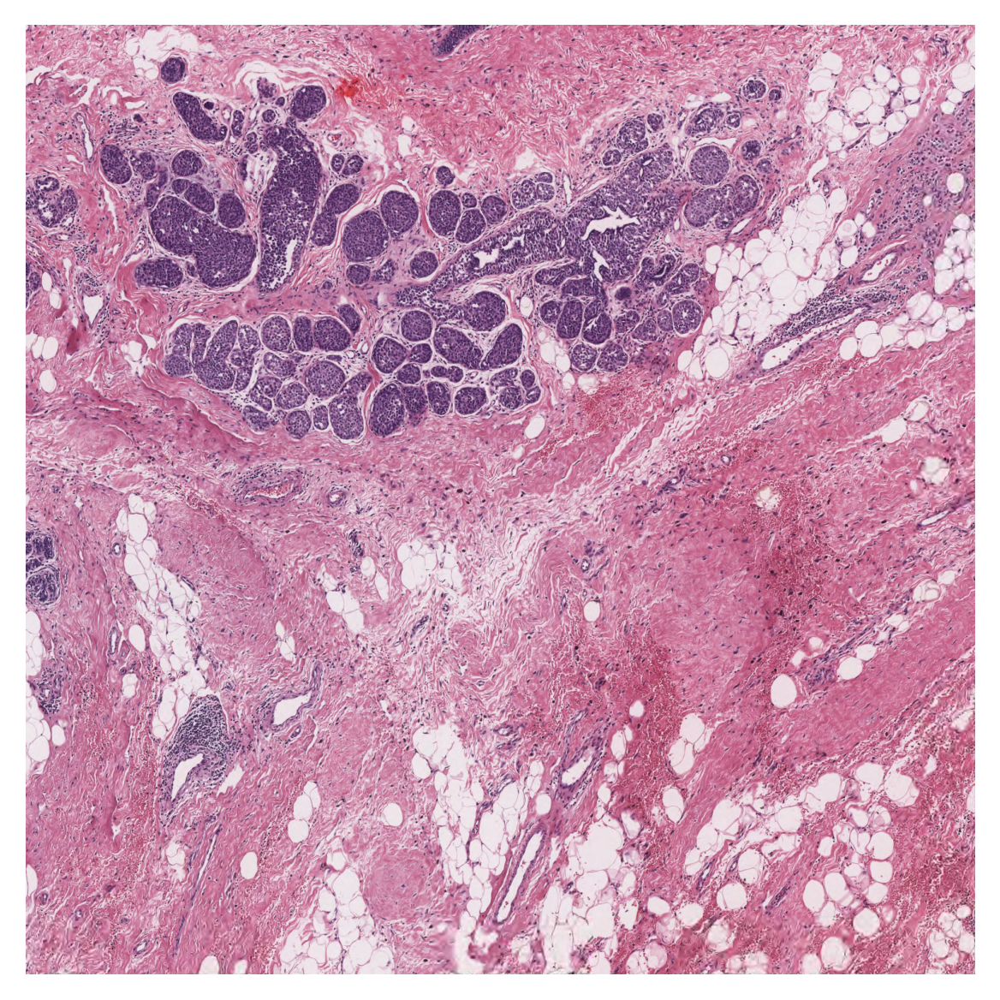

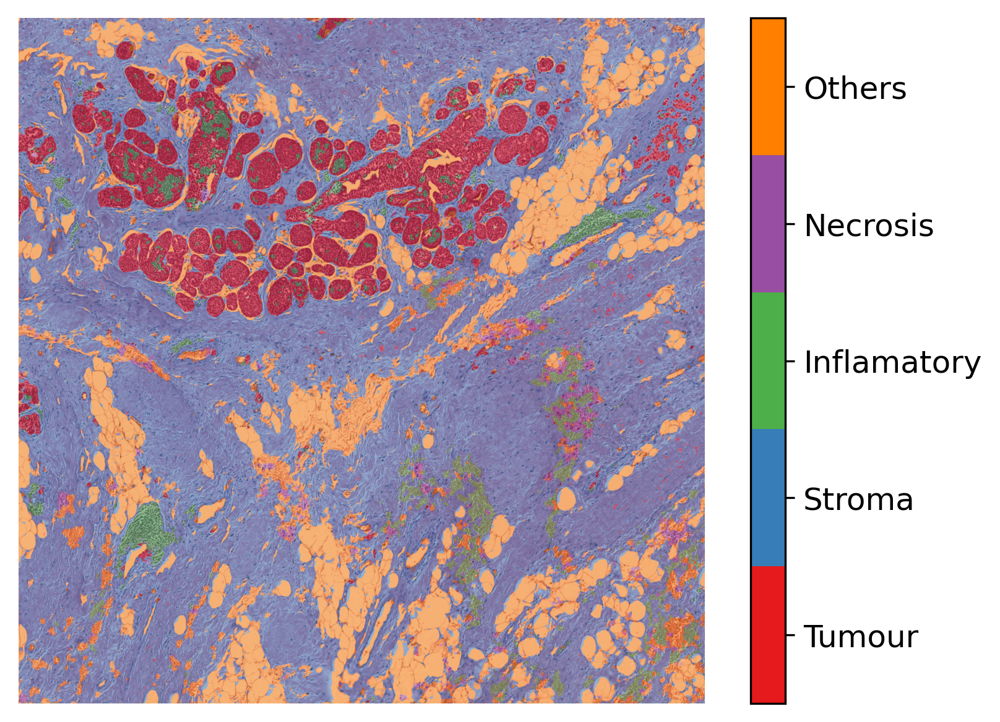

In [10]:
logger.info(
    "Prediction method output is: %s, %s",
    wsi_output[0][0],
    wsi_output[0][1],
)
wsi_prediction_raw = np.load(
    wsi_output[0][1] + ".raw.0.npy",
)  # Loading the first prediction [0] based on the output address [1]
logger.info(
    "Raw prediction dimensions: (%d, %d, %d)",
    wsi_prediction_raw.shape[0],
    wsi_prediction_raw.shape[1],
    wsi_prediction_raw.shape[2],
)

# Simple processing of the raw prediction to generate semantic segmentation task
wsi_prediction = np.argmax(
    wsi_prediction_raw,
    axis=-1,
)  # select the class with highest probability
logger.info(
    "Processed prediction dimensions: (%d, %d)",
    wsi_prediction.shape[0],
    wsi_prediction.shape[1],
)

# [WSI overview extraction]
# Now reading the WSI to extract it's overview
wsi = WSIReader.open(wsi_file_name)
logger.info(
    "WSI original dimensions: (%d, %d)",
    wsi.info.slide_dimensions[0],
    wsi.info.slide_dimensions[1],
)

# using the prediction save_resolution to create the wsi overview at the same resolution
overview_info = bcc_wsi_ioconfig.save_resolution

# extracting slide overview using `slide_thumbnail` method
wsi_overview = wsi.slide_thumbnail(
    resolution=overview_info["resolution"],
    units=overview_info["units"],
)
logger.info(
    "WSI overview dimensions: (%d, %d)",
    wsi_overview.shape[0],
    wsi_overview.shape[1],
)
plt.figure(), plt.imshow(wsi_overview)
plt.axis("off")

# [Overlay map creation]
# creating label-color dictionary to be fed into `overlay_prediction_mask` function
# to help generating color legend
label_dict = {"Tumour": 0, "Stroma": 1, "Inflamatory": 2, "Necrosis": 3, "Others": 4}
label_color_dict = {}
colors = cm.get_cmap("Set1").colors
for class_name, label in label_dict.items():
    label_color_dict[label] = (class_name, 255 * np.array(colors[label]))
# Creat overlay map using the `overlay_prediction_mask` helper function
overlay = overlay_prediction_mask(
    wsi_overview,
    wsi_prediction,
    alpha=0.5,
    label_info=label_color_dict,
    return_ax=True,
)